In [1]:
import pandas as pd
import numpy as np

from collections import Counter

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import nltk
from nltk.probability import FreqDist
from nltk.tokenize import PunktSentenceTokenizer, TweetTokenizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import (
    silhouette_score,
    calinski_harabasz_score,
    davies_bouldin_score
)
from sklearn.preprocessing import StandardScaler

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP

from datasets import load_dataset

from spacy.lang.en import stop_words

import networkx as nx

/home/acampillos/Desktop/Universidad/Master/TFM/project2/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
from social_media_nlp.visualization.features import get_hashtags, get_mentions, get_urls
from social_media_nlp.visualization.graph import (
    influence_analysis,
    top_neighbors,
    top_similar,
    community_detection,
    collaborative_filtering_recommendation,
)
from social_media_nlp.visualization.hashtag_clustering import HashtagClusterer

In [5]:
dataset = load_dataset("tweet_eval", "sentiment")

In [6]:
df = dataset['train'].to_pandas()

In [7]:
df['hashtags'] = df['text'].apply(lambda x: get_hashtags(x))
df['num_hashtags'] = df['hashtags'].apply(len)
df['mentions'] = df['text'].apply(lambda x: get_mentions(x))
df['num_mentions'] = df['mentions'].apply(len)
df['urls'] = df['text'].apply(lambda x: get_urls(x))
df['num_urls'] = df['urls'].apply(len)

In [8]:
df['label'].value_counts()

label
1    20673
2    17849
0     7093
Name: count, dtype: int64

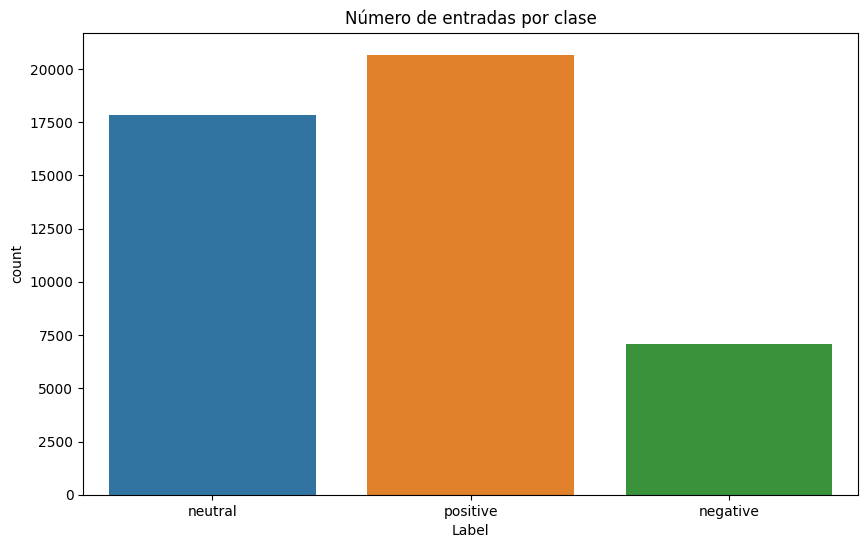

In [9]:
df['mapped_label'] = df['label'].map({0: 'negative', 1: 'positive', 2: 'neutral'})

plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='mapped_label', hue='mapped_label')
plt.title('Número de entradas por clase')
plt.xlabel('Label')
plt.show()

# General statistics

In [10]:
words = nltk.word_tokenize(df['text'].str.cat(sep=' '))
fd = nltk.FreqDist(words)

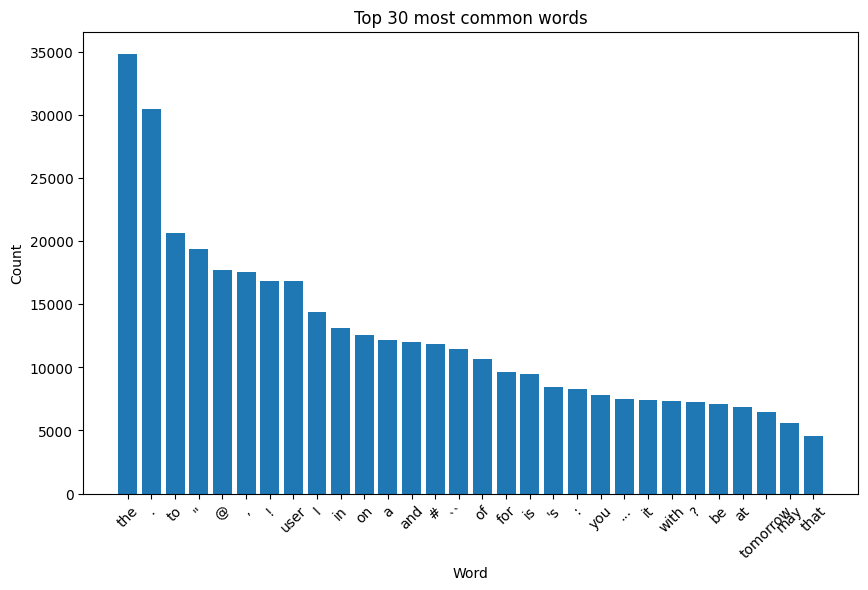

In [11]:
plt.figure(figsize=(10, 6))
most_common_words = fd.most_common(30)
words, counts = zip(*most_common_words)
plt.bar(words, counts)
plt.title('Top 30 most common words')
plt.xlabel('Word')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

In [12]:
lower_fd = nltk.FreqDist([w.lower() for w in fd])
lower_fd.most_common(3)

[('happy', 6), ('and', 5), ('this', 5)]

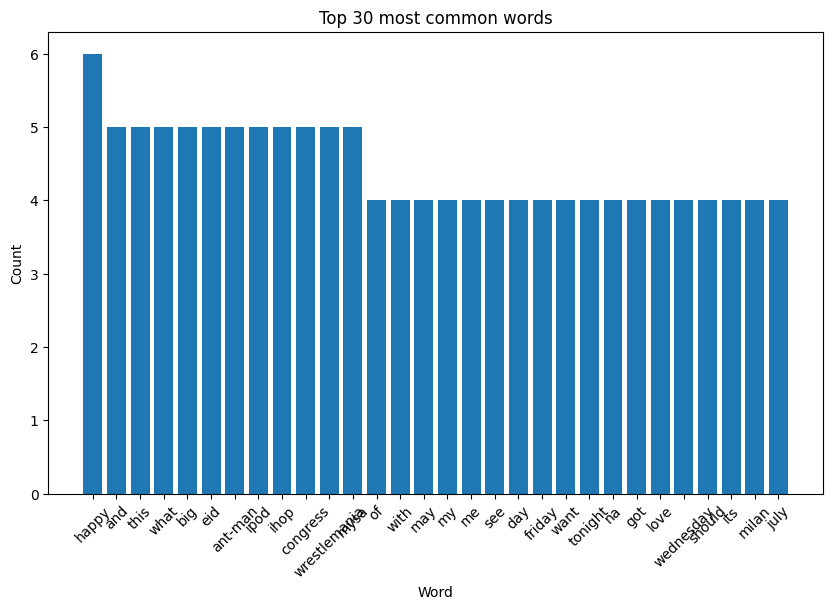

In [13]:
plt.figure(figsize=(10, 6))
most_common_words = lower_fd.most_common(30)
words, counts = zip(*most_common_words)
plt.bar(words, counts)
plt.title('Top 30 most common words')
plt.xlabel('Word')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

In [16]:
finder = nltk.collocations.TrigramCollocationFinder.from_words(words)

In [17]:
finder.ngram_fd.most_common(5)

[(('happy', 'and', 'this'), 1),
 (('and', 'this', 'what'), 1),
 (('this', 'what', 'big'), 1),
 (('what', 'big', 'eid'), 1),
 (('big', 'eid', 'ant-man'), 1)]

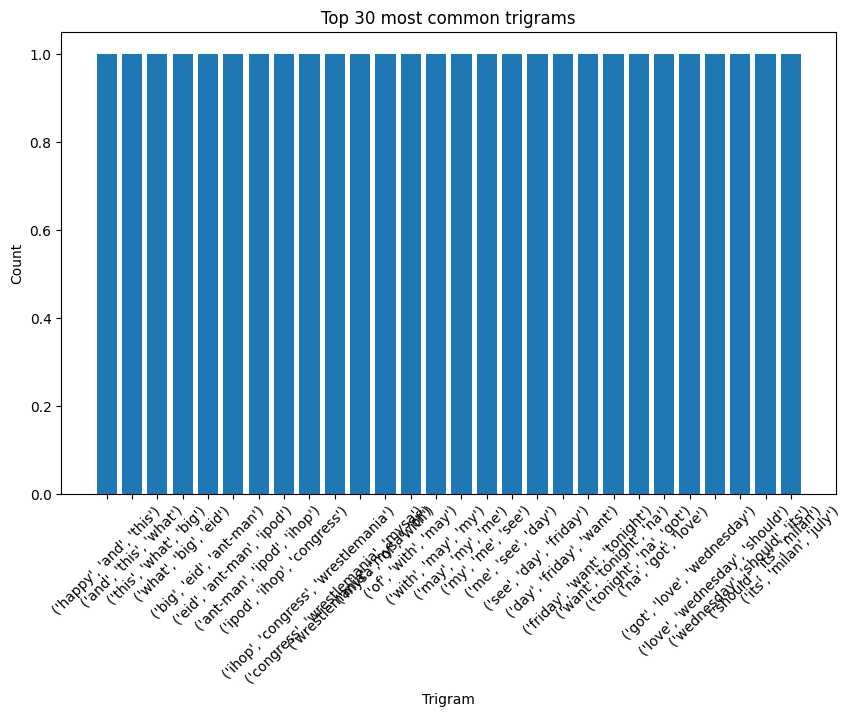

In [18]:
plt.figure(figsize=(10, 6))
most_common_trigrams = finder.ngram_fd.most_common(30)
trigrams, counts = zip(*most_common_trigrams)
trigrams = [str(trigram) for trigram in trigrams]
plt.bar(trigrams, counts)
plt.title('Top 30 most common trigrams')
plt.xlabel('Trigram')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

Text length

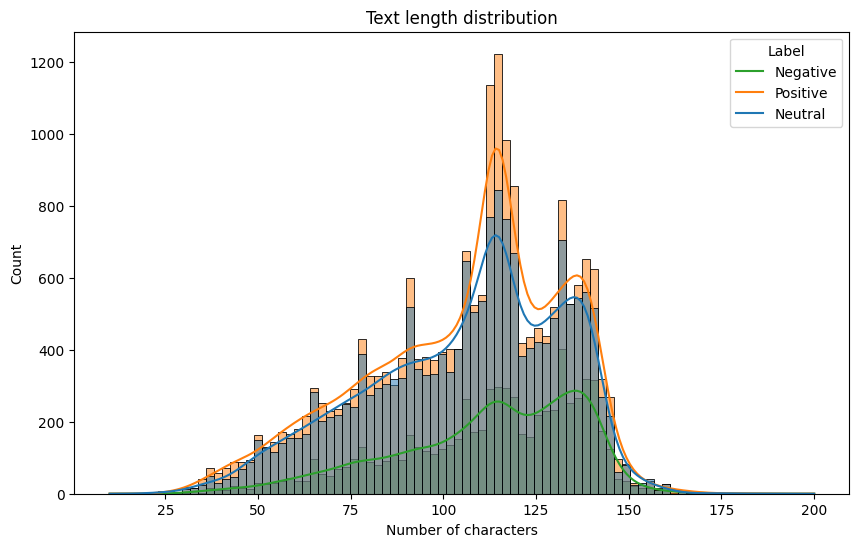

In [19]:
df['text_length'] = df['text'].apply(len)

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='text_length', hue='mapped_label', kde=True)
plt.legend(title='Label', loc='upper right', labels=['Negative', 'Positive', 'Neutral'])
plt.title('Text length distribution')
plt.xlabel('Number of characters')
plt.show()

In [20]:
df['text_length'].describe()

count    45615.000000
mean       106.932851
std         26.251517
min         10.000000
25%         89.000000
50%        113.000000
75%        128.000000
max        200.000000
Name: text_length, dtype: float64

Word count

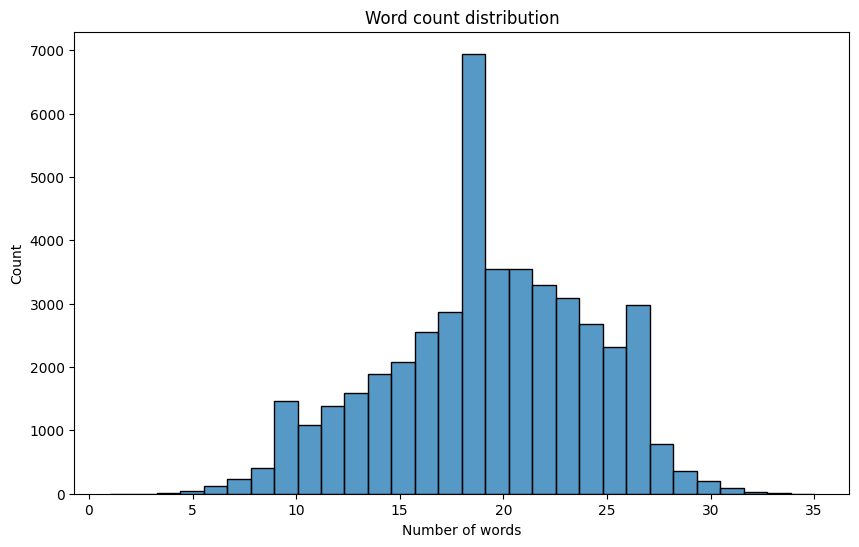

In [21]:
word_count = df['text'].apply(lambda x: len(x.split()))
plt.figure(figsize=(10, 6))
sns.histplot(word_count, bins=30)
plt.title('Word count distribution')
plt.xlabel('Number of words')
plt.show()

In [22]:
word_count.describe()

count    45615.000000
mean        19.237444
std          4.935990
min          1.000000
25%         16.000000
50%         20.000000
75%         23.000000
max         35.000000
Name: text, dtype: float64

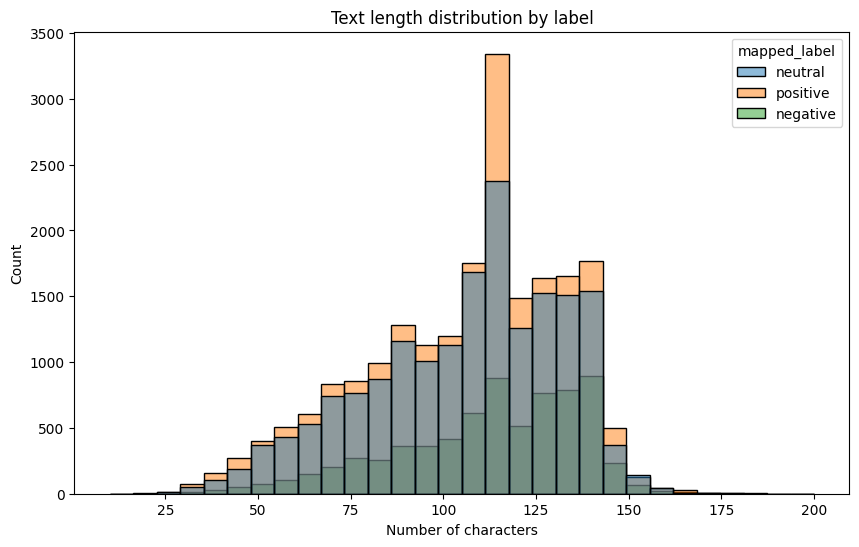

In [23]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='text_length', bins=30, hue='mapped_label')
plt.title('Text length distribution by label')
plt.xlabel('Number of characters')
plt.show()

Average word length

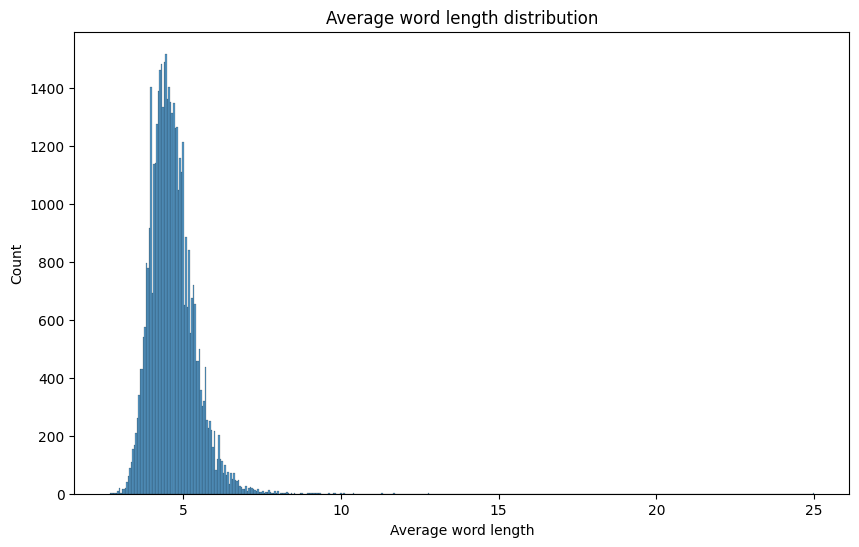

In [24]:
word_lengths = df['text'].apply(lambda x: [len(w) for w in x.split()])
avg_word_lengths = word_lengths.apply(np.mean)
plt.figure(figsize=(10, 6))
sns.histplot(avg_word_lengths)
plt.title('Average word length distribution')
plt.xlabel('Average word length')
plt.show()

In [25]:
avg_word_lengths.describe()

count    45615.000000
mean         4.656377
std          0.691251
min          2.666667
25%          4.187500
50%          4.571429
75%          5.043478
max         25.000000
Name: text, dtype: float64

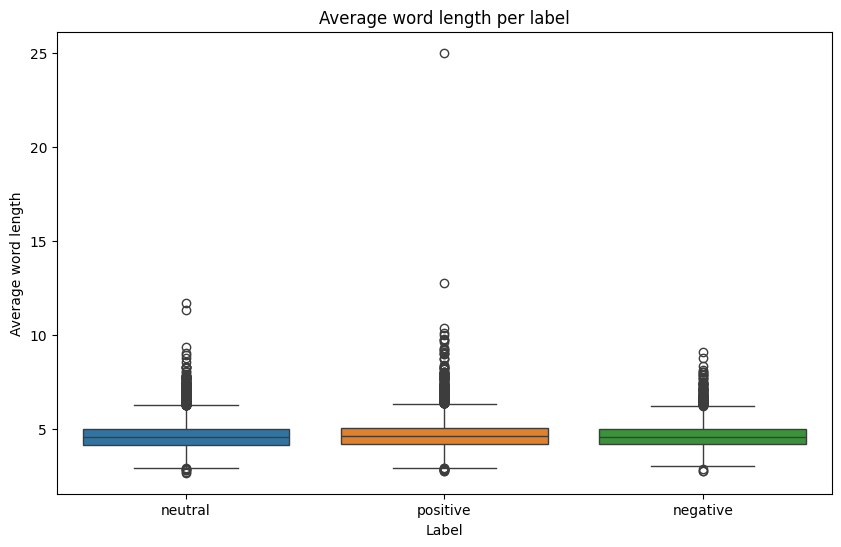

In [29]:
df['avg_word_length'] = avg_word_lengths
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='mapped_label', y='avg_word_length', hue='mapped_label')
plt.title('Average word length per label')
plt.xlabel('Label')
plt.ylabel('Average word length')
plt.show()

Tokens count

In [30]:
tokenizer = TweetTokenizer()

In [31]:
df['tokens'] = df['text'].apply(lambda x: tokenizer.tokenize(x))

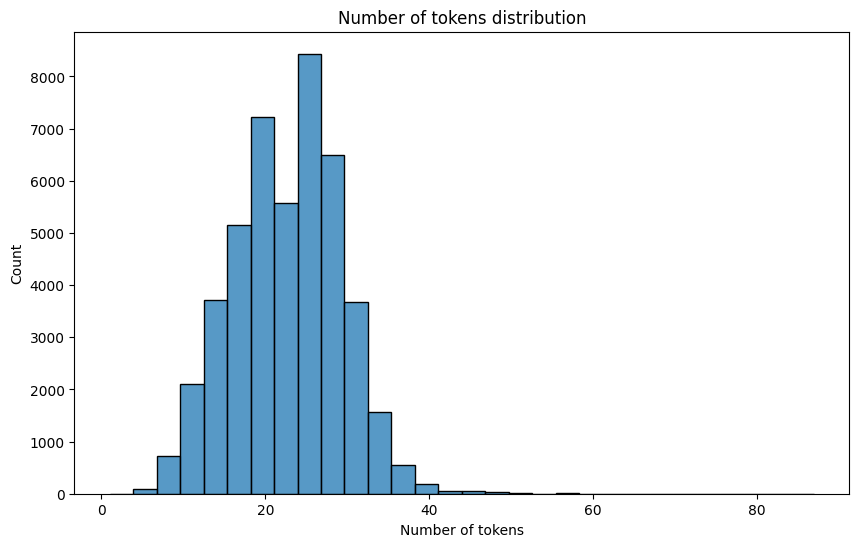

In [32]:
df['num_tokens'] = df['tokens'].apply(len)
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='num_tokens', bins=30)
plt.title('Number of tokens distribution')
plt.xlabel('Number of tokens')
plt.show()

In [33]:
df['num_tokens'].describe()

count    45615.000000
mean        22.640403
std          6.405853
min          1.000000
25%         18.000000
50%         23.000000
75%         27.000000
max         87.000000
Name: num_tokens, dtype: float64

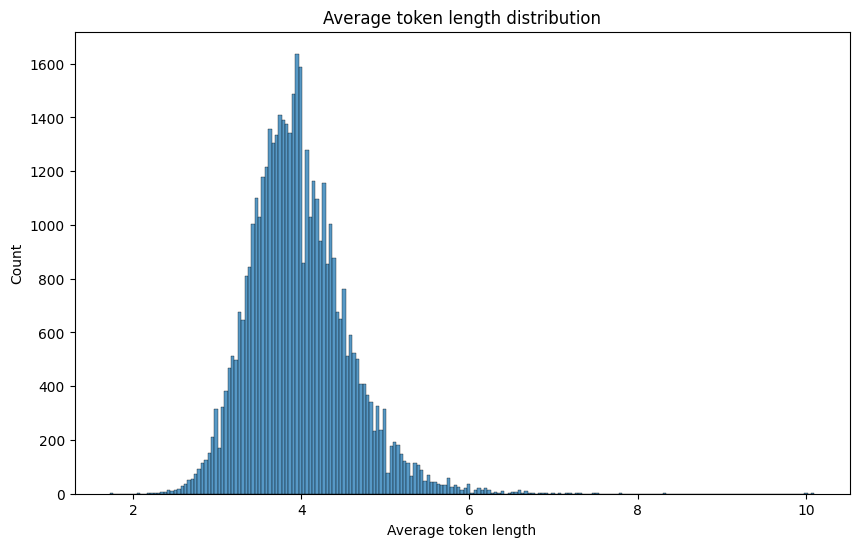

In [34]:
token_lengths = df['tokens'].apply(lambda x: [len(w) for w in x])
avg_token_lengths = token_lengths.apply(np.mean)
plt.figure(figsize=(10, 6))
sns.histplot(avg_token_lengths)
plt.title('Average token length distribution')
plt.xlabel('Average token length')
plt.show()

In [35]:
avg_token_lengths.describe()

count    45615.000000
mean         3.972036
std          0.577860
min          1.724138
25%          3.583333
50%          3.916667
75%          4.300000
max         10.100000
Name: tokens, dtype: float64

Sentence length

In [36]:
sentencizer = PunktSentenceTokenizer()

In [37]:
df['sentences'] = df['text'].apply(lambda x: sentencizer.tokenize(x))
df['num_sentences'] = df['sentences'].apply(len)

In [38]:
df['num_sentences'].describe()

count    45615.000000
mean         1.752954
std          0.913464
min          1.000000
25%          1.000000
50%          2.000000
75%          2.000000
max          9.000000
Name: num_sentences, dtype: float64

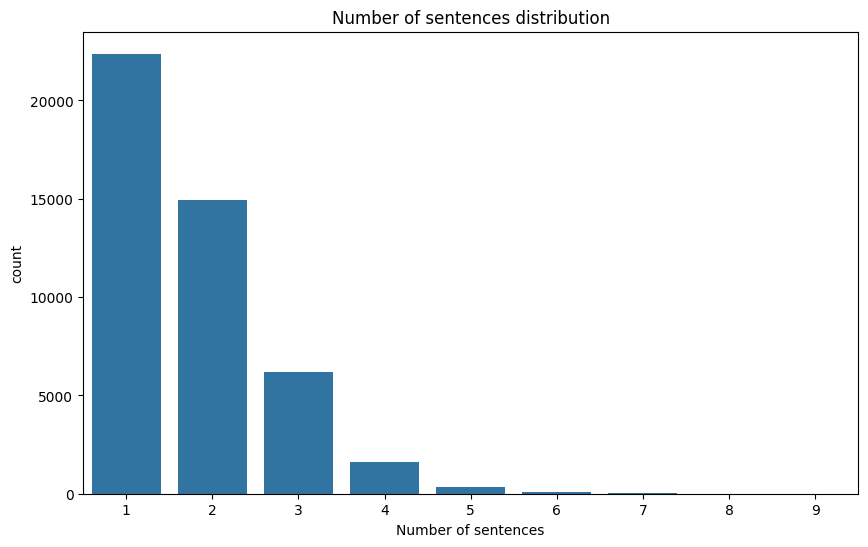

In [39]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='num_sentences')
plt.title('Number of sentences distribution')
plt.xlabel('Number of sentences')
plt.show()

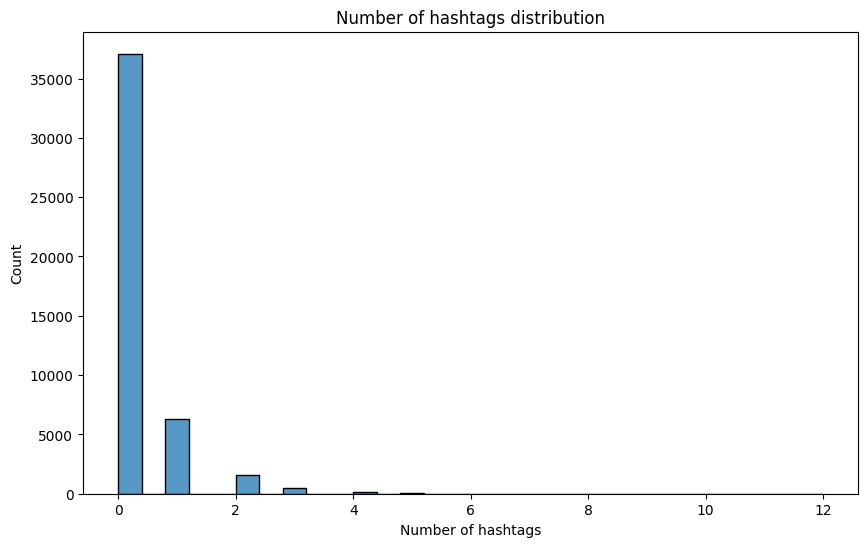

In [40]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='num_hashtags', bins=30)
plt.title('Number of hashtags distribution')
plt.xlabel('Number of hashtags')
plt.show()

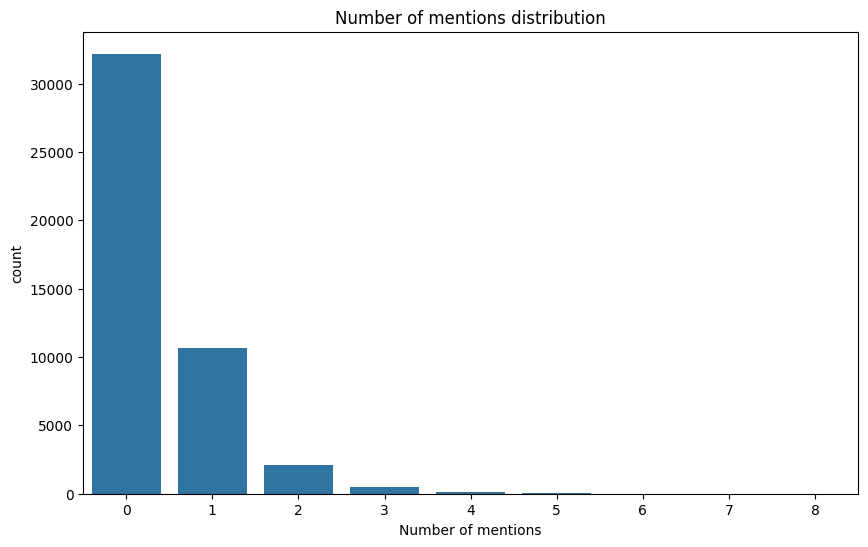

In [41]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='num_mentions')
plt.title('Number of mentions distribution')
plt.xlabel('Number of mentions')
plt.show()

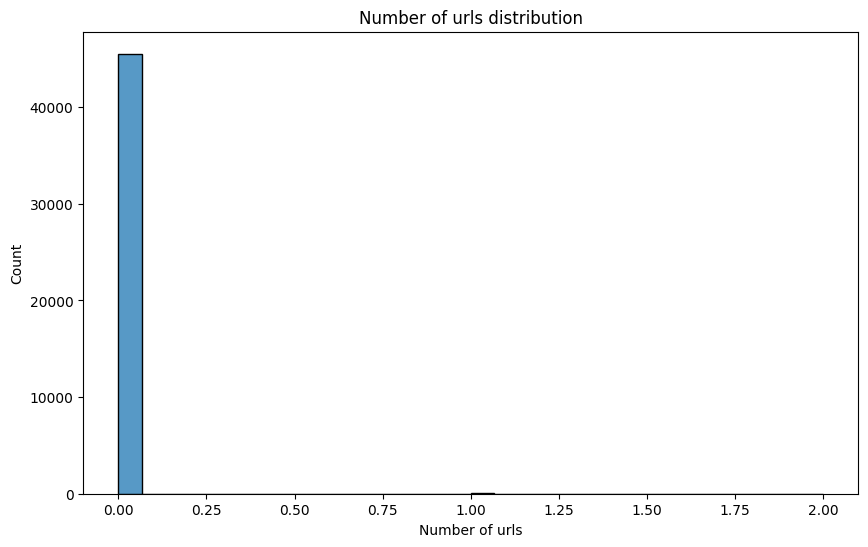

In [42]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='num_urls', bins=30)
plt.title('Number of urls distribution')
plt.xlabel('Number of urls')
plt.show()

In [43]:
Counter(df['text'].str.split(expand=True).stack()).most_common(10)

[('the', 34587),
 ('to', 20490),
 ('@user', 16830),
 ('in', 12896),
 ('on', 12311),
 ('a', 12011),
 ('and', 11797),
 ('of', 10581),
 ('I', 10555),
 ('for', 9543)]

In [44]:
most_common = FreqDist(df['text'].str.split(expand=True).stack()).most_common(10)
most_common

[('the', 34587),
 ('to', 20490),
 ('@user', 16830),
 ('in', 12896),
 ('on', 12311),
 ('a', 12011),
 ('and', 11797),
 ('of', 10581),
 ('I', 10555),
 ('for', 9543)]

## Stopwords

In [45]:
stop = stop_words.STOP_WORDS
df['stopwords'] = df['text'].apply(lambda x: len([x for x in x.split() if x in stop]))

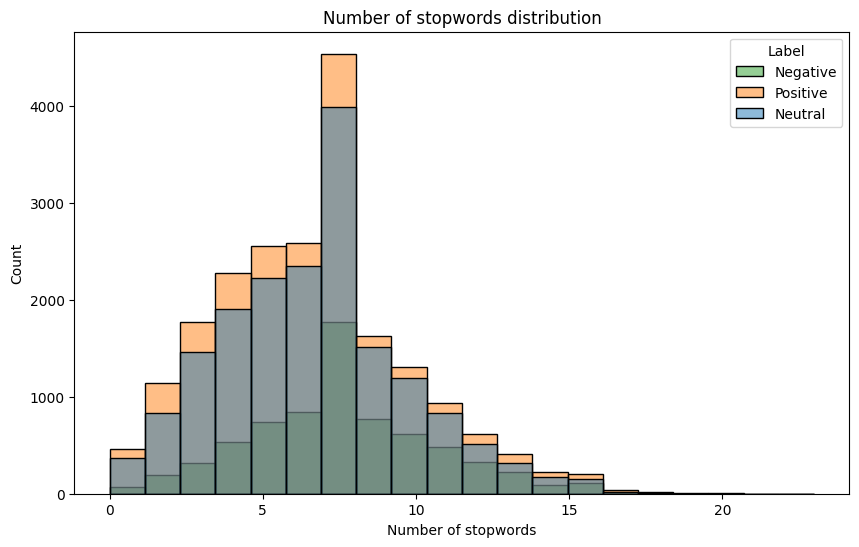

In [46]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='stopwords', bins=20, hue='mapped_label')
plt.title('Number of stopwords distribution')
plt.xlabel('Number of stopwords')
plt.legend(title='Label', loc='upper right', labels=['Negative', 'Positive', 'Neutral'])
plt.show()

In [47]:
df['stopwords'].describe()

count    45615.000000
mean         6.804713
std          3.099915
min          0.000000
25%          5.000000
50%          7.000000
75%          9.000000
max         23.000000
Name: stopwords, dtype: float64

Stop words frequency

In [48]:
stop_freq = df['text'].str.split(expand=True).unstack().value_counts()
stop_freq = stop_freq[stop_freq.index.isin(stop)]

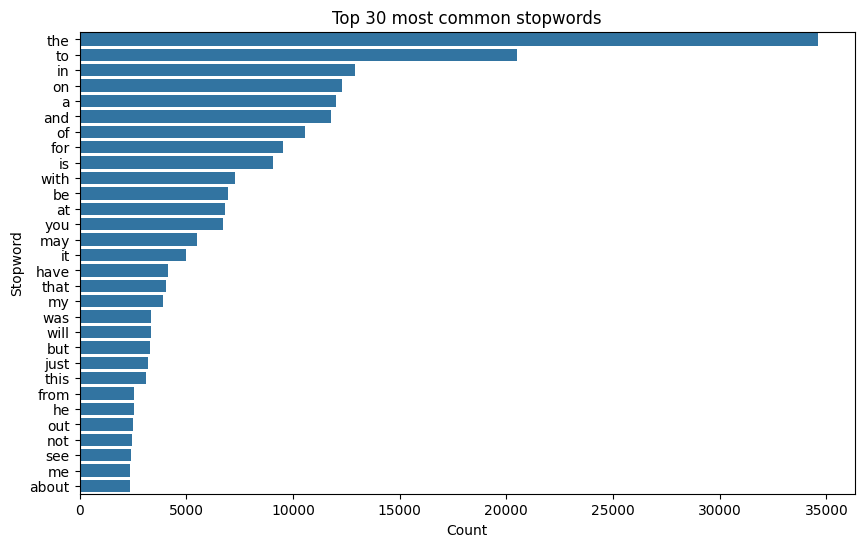

In [49]:
n = 30

plt.figure(figsize=(10, 6))
sns.barplot(y=stop_freq[:n].index, x=stop_freq[:n].values)
plt.title(f'Top {n} most common stopwords')
plt.xlabel('Count')
plt.ylabel('Stopword')
plt.show()

Non stop words frequency

In [50]:
non_stop_freq = df['text'].str.split(expand=True).unstack().value_counts()
non_stop_freq = non_stop_freq[~non_stop_freq.index.isin(stop)]

In [51]:
non_stop_freq[:15]

@user       16830
I           10555
tomorrow     4039
going        2746
The          2612
-            2591
1st          2337
like         2226
I'm          1953
day          1898
&amp;        1774
2nd          1696
time         1655
Friday       1627
night        1544
Name: count, dtype: int64

# N-grams

In [52]:
vectorizer = CountVectorizer(ngram_range=(2,2))
bigrams_sparse = vectorizer.fit_transform(df['text'])

In [53]:
ngram_freq = pd.DataFrame.sparse.from_spmatrix(bigrams_sparse, columns=vectorizer.get_feature_names_out())
total_counts = ngram_freq.sum(axis=0)
sorted_ngrams = total_counts.sort_values(ascending=False)

In [54]:
sorted_ngrams[:15]

in the       3589
user user    2682
of the       2566
on the       2366
for the      2351
going to     2223
at the       1977
to the       1840
may be       1499
will be      1290
to see       1284
to be        1224
may have     1000
is the        982
the 1st       946
dtype: Sparse[int64, 0]

In [55]:
vectorizer = CountVectorizer(ngram_range=(3,3))
trigrams_sparse = vectorizer.fit_transform(df['text'])

In [56]:
ngram_freq = pd.DataFrame.sparse.from_spmatrix(trigrams_sparse, columns=vectorizer.get_feature_names_out())
total_counts = ngram_freq.sum(axis=0)
sorted_ngrams = total_counts.sort_values(ascending=False)

In [57]:
sorted_ngrams[:15]

user user user        734
going to be           452
is going to           344
may be the            289
may not be            254
one of the            228
going to see          210
to go to              206
going to the          201
the 1st time          185
looking forward to    170
national hot dog      165
ice cream day         164
national ice cream    163
hot dog day           163
dtype: Sparse[int64, 0]

# Hashtag

In [59]:
df['hashtags'].explode().dropna().value_counts()[50:100]

hashtags
#excited                 13
#Yankees                 13
#StraightOuttaCompton    13
#mufc                    13
#SFGiants                13
#NBA                     13
#elxn42                  12
#boxing                  12
#Texans                  12
#Dexter                  12
#p2                      12
#GH                      12
#LFC                     12
#Nats                    11
#MTVSTARS                11
#tech                    11
#MTVHottest              11
#039                     11
#DragMeDownMusicVideo    11
#Sunday                  11
#F1                      10
#NowPlaying              10
#Sandy                   10
#CBB                     10
#GOP                     10
#PGAChamp                10
#Hannibal                10
#MLBFantasy              10
#love                    10
#SPECTRE                 10
#FF                       9
#3                        9
#WWENetwork               9
#CincyTennis              9
#Royals                   9
#RIPFrankGi

In [60]:
df['hashtags'].explode().dropna().value_counts().describe()

count    7659.000000
mean        1.538060
std         3.294694
min         1.000000
25%         1.000000
50%         1.000000
75%         1.000000
max       120.000000
Name: count, dtype: float64

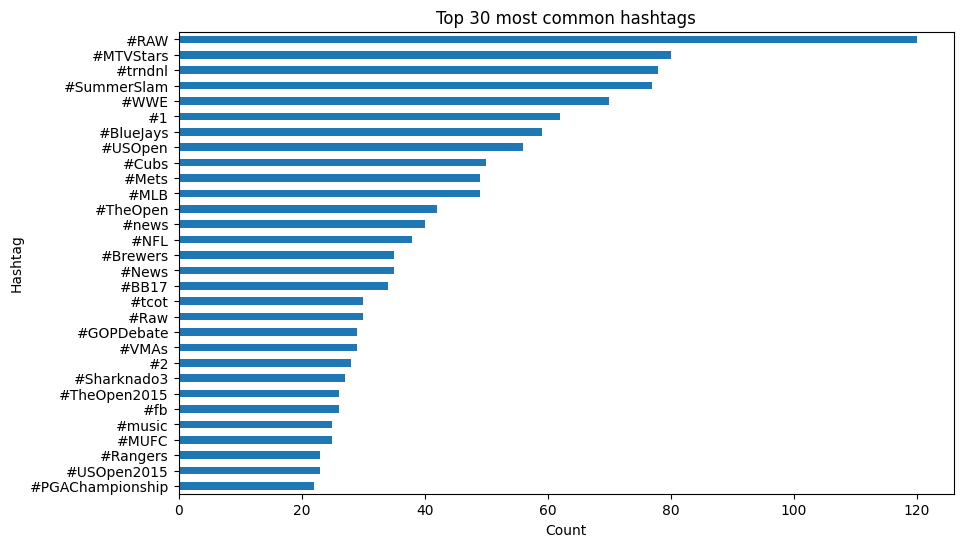

In [61]:
k = 30

plt.figure(figsize=(10, 6))
df['hashtags'].explode().dropna().value_counts()[:k].sort_values().plot(kind='barh')
plt.title(f'Top {k} most common hashtags')
plt.xlabel('Count')
plt.ylabel('Hashtag')
plt.show()

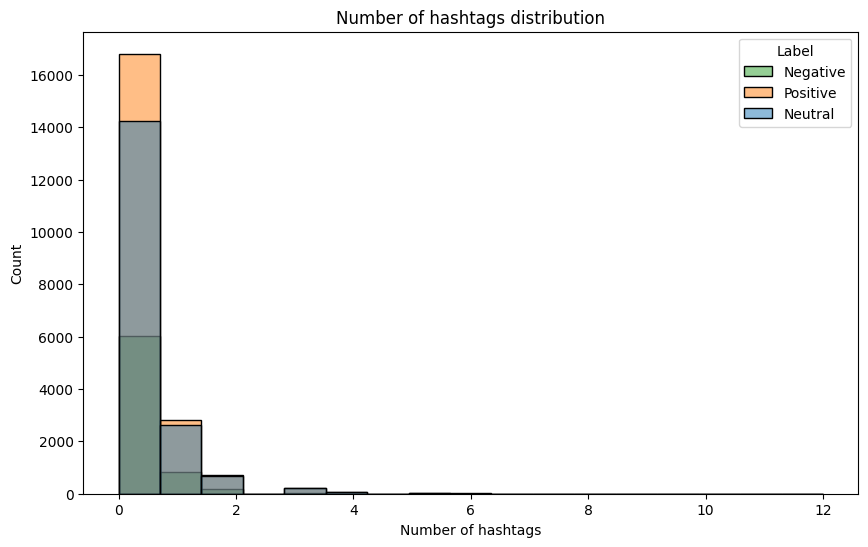

In [62]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='num_hashtags', hue='mapped_label')
plt.legend(title='Label', labels=['Negative', 'Positive', 'Neutral'])
plt.title('Number of hashtags distribution')
plt.xlabel('Number of hashtags')
plt.show()

In [63]:
df = pd.concat([df, dataset['test'].to_pandas()], ignore_index=True)

## Graph modeling

In [64]:
edge_list = [
    (hashtags[i], hashtags[j])
    for hashtags in df[df['hashtags'].notna()]['hashtags'].apply(lambda x: [y.lower() for y in x] if x else None).dropna()
    for i in range(len(hashtags))
    for j in range(i + 1, len(hashtags))
]

In [66]:
G = nx.from_edgelist(edge_list)

In [67]:
co_occurrences = Counter(edge_list)
for (node1, node2), weight in co_occurrences.items():
    G[node1][node2]["weight"] = weight

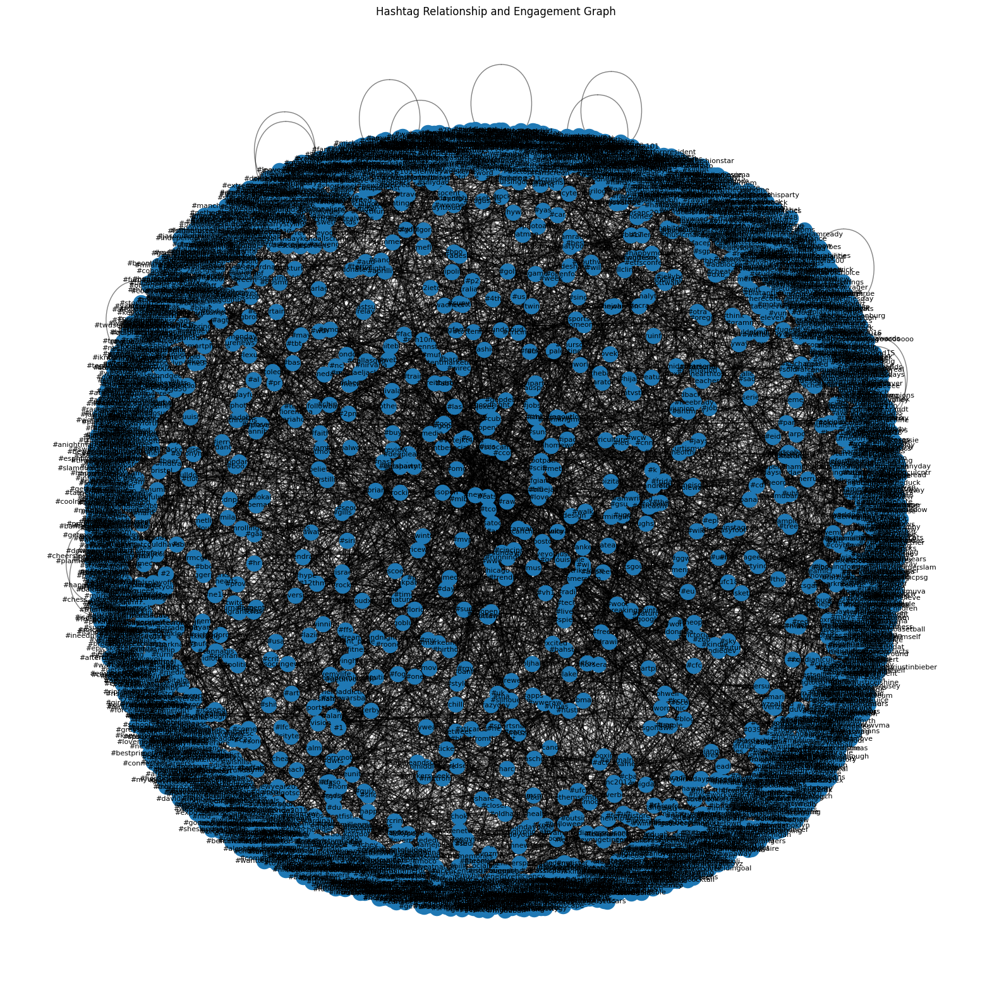

In [69]:
plt.figure(figsize=(20, 20))
pos = nx.spring_layout(G, k=0.5)

nx.draw_networkx_nodes(G, pos, alpha=1.0)

edge_widths = [G.edges[edge]["weight"] for edge in G.edges]
nx.draw_networkx_edges(G, pos, alpha=0.5)

nx.draw_networkx_labels(G, pos, font_size=8)

plt.title("Hashtag Relationship and Engagement Graph")
plt.axis("off")
plt.show()

In [70]:
sorted(G.edges(data=True), key=lambda x: x[2]["weight"], reverse=True)[:30]

[('#wwe', '#raw', {'weight': 16}),
 ('#iphone5', '#iphone5', {'weight': 15}),
 ('#160', '#160', {'weight': 10}),
 ('#raw', '#summerslam', {'weight': 7}),
 ('#mlb', '#mariners', {'weight': 7}),
 ('#np', '#soundcloud', {'weight': 7}),
 ('#summerslam', '#titlefortitle', {'weight': 6}),
 ('#kca', '#votejkt48id', {'weight': 6}),
 ('#ccot', '#tcot', {'weight': 5}),
 ('#bluejays', '#cometogether', {'weight': 5}),
 ('#webradio', '#internetradio', {'weight': 5}),
 ('#csrracing', '#raceyourfriends', {'weight': 5}),
 ('#tcot', '#teaparty', {'weight': 4}),
 ('#wwe', '#summerslam', {'weight': 4}),
 ('#mlb', '#mets', {'weight': 4}),
 ('#mohandas', '#narendra', {'weight': 4}),
 ('#saturday', '#satisfaction', {'weight': 4}),
 ('#econokit', '#bizikent', {'weight': 4}),
 ('#econokit', '#bizitalk', {'weight': 4}),
 ('#bizikent', '#bizitalk', {'weight': 4}),
 ('#news', '#may', {'weight': 3}),
 ('#news', '#omg', {'weight': 3}),
 ('#news', '#nfb', {'weight': 3}),
 ('#news', '#keepgrunge', {'weight': 3}),
 (

In [71]:
co_ocurrences_df = pd.Series(co_occurrences).sort_values(ascending=False)[:k].to_frame()
co_ocurrences_df.columns = ['count']
co_ocurrences_df = co_ocurrences_df.reset_index()
co_ocurrences_df['hashtags'] = '(' + co_ocurrences_df['level_0'] + ', ' + co_ocurrences_df['level_1'] + ')'

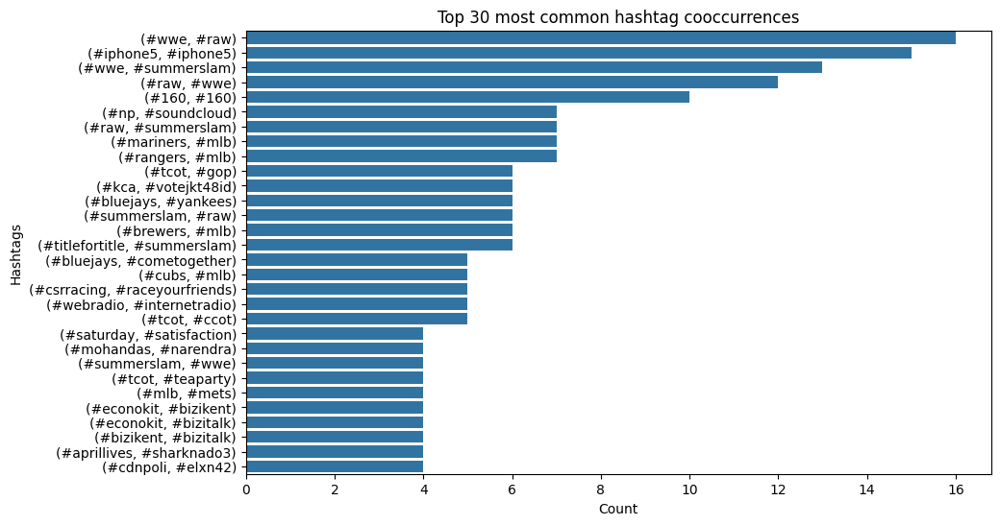

In [72]:
k = 30

plt.figure(figsize=(10, 6))
sns.barplot(data=co_ocurrences_df[:k], x='count', y='hashtags')
plt.title(f'Top {k} most common hashtag cooccurrences')
plt.xlabel('Count')
plt.ylabel('Hashtags')
plt.show()

In [74]:
hashtag = "#nba"

In [75]:
print(f"Neighbors of {hashtag}: {list(G.neighbors(hashtag))}")
print(f"Top neighbors of {hashtag}: {top_neighbors(G, hashtag)}")
print(f"Top similar hashtags to {hashtag}: {top_similar(G, hashtag)}")

Neighbors of #nba: ['#nets', '#clippers', '#sports', '#mlb', '#nfl', '#kobe', '#lakers', '#openfollow', '#gsw', '#suns', '#kings', '#playersnews', '#spurs']
Top neighbors of #nba: [('#mlb', 35), ('#nfl', 31), ('#sports', 12), ('#lakers', 7), ('#spurs', 6)]
Top similar hashtags to #nba: [('#nba', '#lakers', 0.42857142857142855), ('#nba', '#clippers', 0.2857142857142857), ('#nba', '#gsw', 0.2857142857142857), ('#nba', '#suns', 0.2857142857142857), ('#nba', '#kings', 0.2857142857142857)]


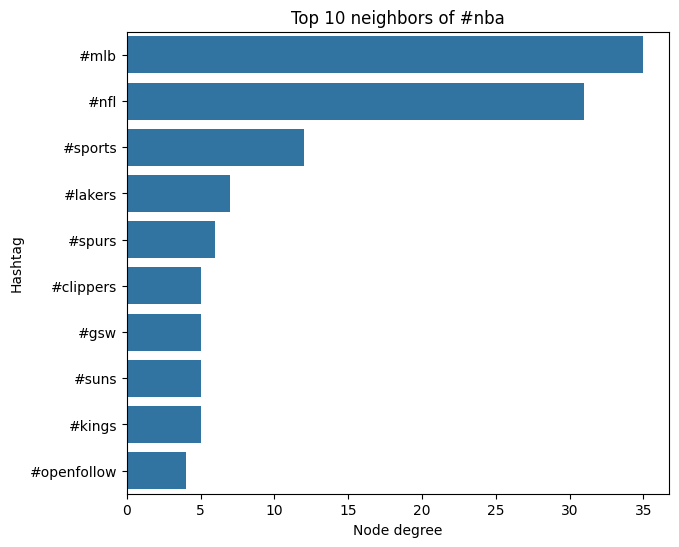

In [76]:
plt.figure(figsize=(7, 6))
top_neigbor_hashtags = top_neighbors(G, hashtag, 10)
top_neigbor_hashtags = {hashtag: weight for hashtag, weight in top_neigbor_hashtags}
sns.barplot(y=list(top_neigbor_hashtags.keys()), x=list(top_neigbor_hashtags.values()))
plt.title(f'Top 10 neighbors of {hashtag}')
plt.xlabel('Node degree')
plt.ylabel('Hashtag')
plt.show()

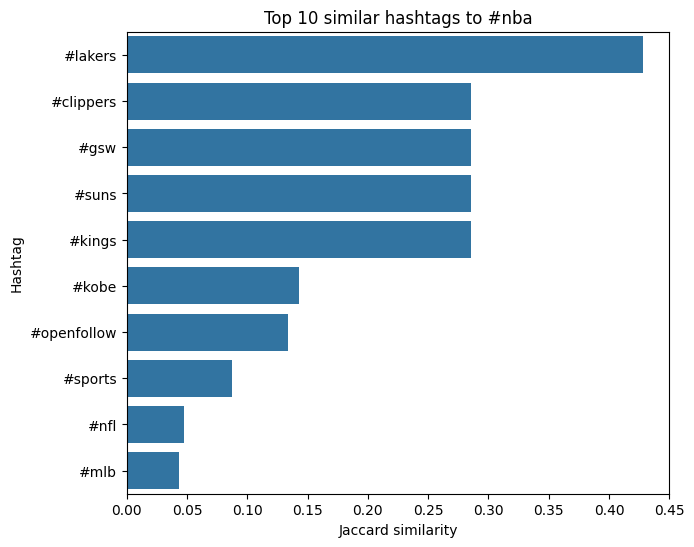

In [77]:
plt.figure(figsize=(7, 6))
top_similar_hashtags = top_similar(G, hashtag, 10)
top_similar_hashtags = {hashtag: weight for _, hashtag, weight in top_similar_hashtags}
sns.barplot(y=list(top_similar_hashtags.keys()), x=list(top_similar_hashtags.values()))
plt.title(f'Top 10 similar hashtags to {hashtag}')
plt.xlabel('Jaccard similarity')
plt.ylabel('Hashtag')
plt.show()

In [78]:
interacted_hashtags = ["#mlb", "#nfl"]

print(f"Recommended hashtags based on user interactions: {interacted_hashtags}")
print(collaborative_filtering_recommendation(G, interacted_hashtags))

print(f"Influence of {hashtag}: {influence_analysis(G, hashtag)}")

Recommended hashtags based on user interactions: ['#mlb', '#nfl']
[('#texans', 1), ('#jetsnation', 1), ('#metsvsroyals', 1), ('#jets', 1), ('#football', 1)]


In [79]:
print("Communities:")
communities = community_detection(G)
print(len(communities))
for i, community in enumerate(communities[:15], 1):
    print(f"Community {i}: {list(community)}")

    degree_centralities = nx.degree_centrality(G.subgraph(community))
    sorted_nodes = sorted(degree_centralities, key=degree_centralities.get, reverse=True)
    print("Nodes with highest degree centrality in community:")
    for node in sorted_nodes[:5]:
        print(f"Node {node}: Degree Centrality = {degree_centralities[node]}")

Communities:
916
Community 1: ['#mnf', '#daesh', '#panthers', '#chicago', '#nfceast', '#businessinsider', '#brianatellsall', '#gadgets', '#pens', '#youku', '#fantasyfootball', '#bbcupdat', '#soccer', '#katyperry', '#jamaica', '#nato', '#nyceats', '#chargers', '#royalbaby', '#nyjvsne', '#style', '#shopping', '#auction', '#tv', '#november', '#texans', '#gop2012', '#homs', '#jets', '#practiceupdate', '#websitedesign', '#exhibition', '#photo', '#ny', '#vh1', '#bestprimetimelineup', '#oc', '#keepgrunge', '#influence', '#buy', '#k', '#photoaday', '#millennials', '#whenwillitend', '#business', '#hot', '#o', '#marketing', '#nyfw', '#madonna', '#twitterconnect', '#seahawks', '#soccernet', '#beatles', '#wichita', '#appleevent', '#iaaf', '#inbound15', '#nexus', '#packers', '#bestseller', '#freedomofspeech', '#nflfantasy', '#nfl', '#telecom', '#mayweather', '#people', '#frankgifford', '#icecream', '#ipadpro', '#syria', '#photography', '#birthday', '#celebrity', '#risenation', '#future', '#highstre

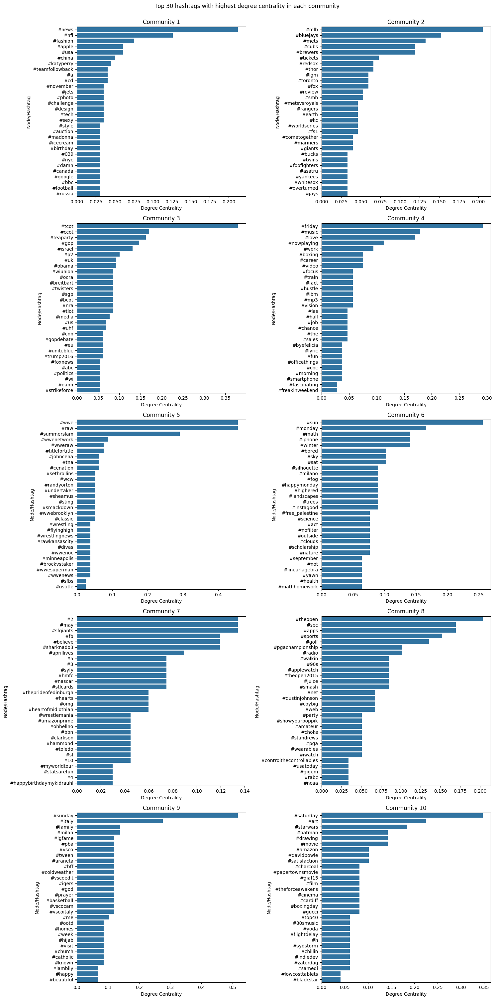

In [80]:
fig, axs = plt.subplots(5, 2, figsize=(15, 30))
axs = axs.ravel()
for i, community in enumerate(communities[:10], 1):
    degree_centralities = nx.degree_centrality(G.subgraph(community))
    sorted_nodes = sorted(degree_centralities, key=degree_centralities.get, reverse=True)
    top_nodes = sorted_nodes[:30]
    degrees = [degree_centralities[node] for node in top_nodes]
    sns.barplot(y=top_nodes, x=degrees, ax=axs[i - 1])
    axs[i - 1].set_title(f"Community {i}")
    axs[i - 1].set_xlabel("Degree Centrality")
    axs[i - 1].set_ylabel("Node/Hashtag")

plt.suptitle("Top 30 hashtags with highest degree centrality in each community", y=1.)
plt.tight_layout()
plt.show()

In [81]:
degree_centralities = nx.degree_centrality(G)
sorted_nodes = sorted(degree_centralities, key=degree_centralities.get, reverse=True)
print("Nodes with highest degree centrality:")
for node in sorted_nodes[:30]:
    print(f"Node {node}: Degree Centrality = {degree_centralities[node]}")

Nodes with highest degree centrality:
Node #news: Degree Centrality = 0.01658374792703151
Node #tcot: Degree Centrality = 0.014096185737976783
Node #wwe: Degree Centrality = 0.01077943615257048
Node #raw: Degree Centrality = 0.01077943615257048
Node #mlb: Degree Centrality = 0.009673852957435046
Node #friday: Degree Centrality = 0.008844665561083471
Node #sunday: Degree Centrality = 0.008844665561083471
Node #nfl: Degree Centrality = 0.008568269762299612
Node #music: Degree Centrality = 0.007462686567164179
Node #summerslam: Degree Centrality = 0.006909894969596462
Node #day: Degree Centrality = 0.006633499170812603
Node #sun: Degree Centrality = 0.006633499170812603
Node #israel: Degree Centrality = 0.006633499170812603
Node #bluejays: Degree Centrality = 0.006357103372028745
Node #ccot: Degree Centrality = 0.006080707573244887
Node #usopen: Degree Centrality = 0.006080707573244887
Node #mets: Degree Centrality = 0.006080707573244887
Node #teaparty: Degree Centrality = 0.0058043117744

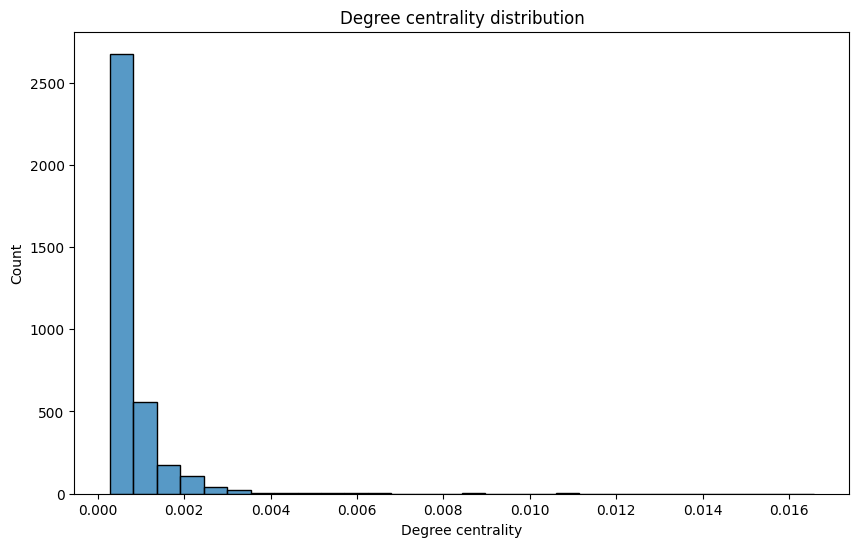

In [82]:
plt.figure(figsize=(10, 6))
sns.histplot(list(degree_centralities.values()), bins=30)
plt.title('Degree centrality distribution')
plt.xlabel('Degree centrality')
plt.show()

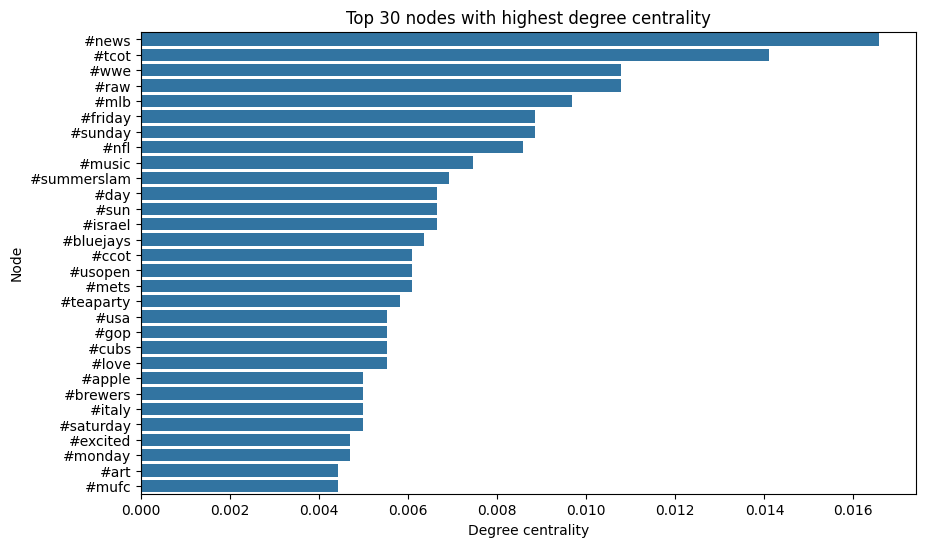

In [83]:
n = 30

plt.figure(figsize=(10, 6))
sns.barplot(y=[node for node in sorted_nodes[:n]], x=[degree_centralities[node] for node in sorted_nodes[:n]])
plt.title(f'Top {n} nodes with highest degree centrality')
plt.ylabel('Node')
plt.xlabel('Degree centrality')
plt.show()

## Embeddings clustering

In [85]:
clusterer = HashtagClusterer()

In [86]:
hashtags = df['hashtags'].explode().dropna()\
    .apply(lambda x: x.split('#')[-1])\
    .str.lower()\
    .to_frame().reset_index(drop=True)

In [87]:
hashtags['segmented_hashtags'] = clusterer._segment_hashtags(hashtags['hashtags'].tolist())

In [88]:
hashtags = hashtags.drop_duplicates(subset=['segmented_hashtags'])

In [89]:
clustering_model, cluster_labels, embeddings = clusterer.cluster_hashtags(
    hashtags['segmented_hashtags'].tolist(),
    model_params={'n_clusters': 10}
)

In [90]:
hashtags['label'] = cluster_labels

In [91]:
clusterer.search_hashtags_within_cluster(
    hashtags['hashtags'].tolist(),
    'nba',
    clustering_model,
    cluster_labels,
    embeddings
)

[]

In [92]:
def find_optimal_clusters(x, max_k=10, step=5):
    metrics = {
        'inertia': [],
        'silhouette': [],
        'calinski_harabasz': [],
        'davies_bouldin': []
    }
    for k in range(2, max_k + 1, step):
        clustering_model, cluster_labels, embeddings = clusterer.cluster_hashtags(
            hashtags['segmented_hashtags'].tolist(),
            model_params={'n_clusters': k}
        )
        silhouette = silhouette_score(embeddings, cluster_labels)
        metrics['inertia'].append(clustering_model.inertia_)
        metrics['silhouette'].append(silhouette)
        metrics['calinski_harabasz'].append(calinski_harabasz_score(embeddings, cluster_labels))
        metrics['davies_bouldin'].append(davies_bouldin_score(embeddings, cluster_labels))

    return metrics

def plot_metrics(metrics, metric, max_k=10, step=5):
    plt.plot(range(2, max_k + 1, step), metrics, marker='o')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel(metric)
    plt.title(f'{metric} vs. Number of clusters')
    plt.show()

In [93]:
max_k = 3000
step = 100

In [94]:
metrics = find_optimal_clusters(embeddings, max_k, step)

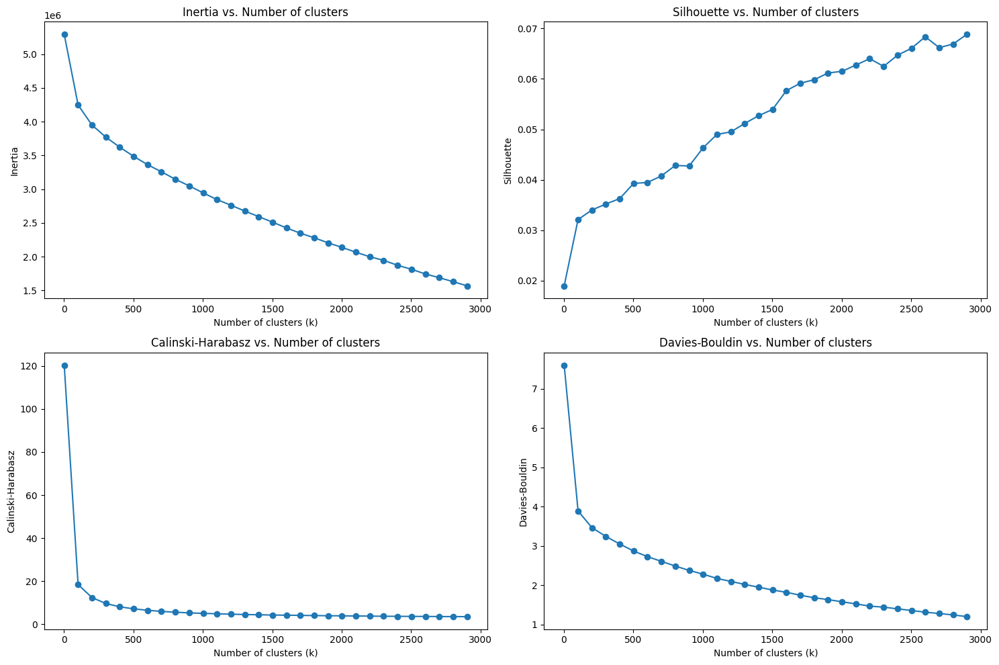

In [95]:
for metric, name in zip(['inertia', 'silhouette', 'calinski_harabasz', 'davies_bouldin'], ['Inertia', 'Silhouette', 'Calinski-Harabasz', 'Davies-Bouldin']):
    fig, axs = plt.subplots(2, 2, figsize=(15, 10))
    axs = axs.ravel()
    for i, (metric, name) in enumerate(zip(['inertia', 'silhouette', 'calinski_harabasz', 'davies_bouldin'], ['Inertia', 'Silhouette', 'Calinski-Harabasz', 'Davies-Bouldin'])):
        axs[i].plot(range(2, max_k + 1, step), metrics[metric], marker='o')
        axs[i].set_xlabel('Number of clusters (k)')
        axs[i].set_ylabel(name)
        axs[i].set_title(f'{name} vs. Number of clusters')

    plt.tight_layout()
    plt.show()

Number of clusters: 100


/home/acampillos/Desktop/Universidad/Master/TFM/project2/.venv/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


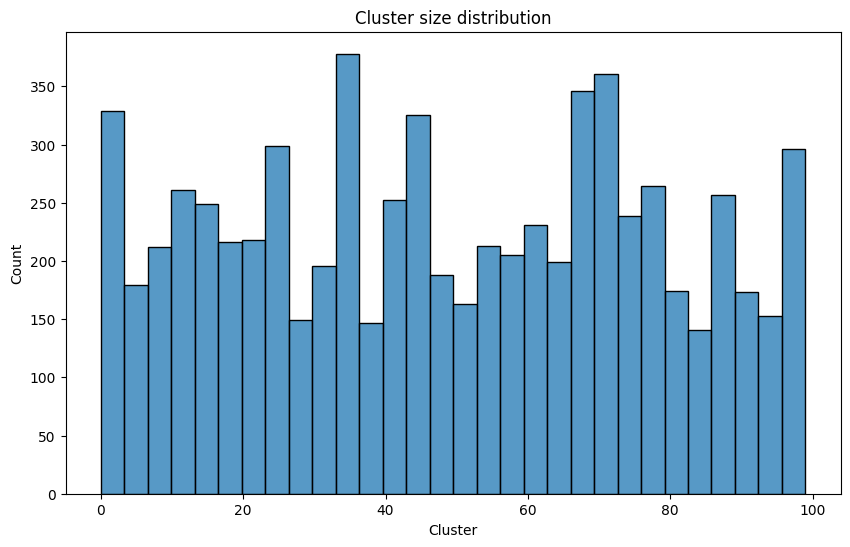

['alds', 'accents', 'aldubtherevelation', 'lfa', 'sona', 'cua', 'smaaashhh', 'artistaacademy', 'therealjz', 'aactas', 'chavbants', 'asatru', 'ade', 'amas', 'atmananda', 'arshull', 'samac', 'soa', 'afmobi', 'bna', 'qanda', 'aa', 'acc', 'gaa', 'ad', 'raaf', 'al', 'kca', 'adn', 'idolssa']
['happybirthdayremuslupin', 'birthday', 'primeday', 'icecreamday', 'birthdayboy', 'nationalhotdogday', 'proclamationday', 'nationalicecreamday', 'daymade', 'day', 'vjday', 'comradeoftheday', 'may4thbewithyou', 'dapperday', 'bdayvaycay', 'goldenday', 'milkchocolateday', 'beyday', 'reclaimthemorning', 'goingtobealongday', 'happybirthdayprincegeorge', 'valentinesdaycansuckit', 'dailydouble', 'onthisday1987', 'valentine', 'gooddayoff', 'celebratetherightholiday', 'happyeid', 'thirstythirsday', 'happyholidays']
['vibetribe', 'localsyr', 'risenation', 'cardinalnation', 'nova', 'celticnation', 'nationals', 'warkingsbu', 'dtnation', 'tarheelnation', 'snp', 'awakenthenorth', 'vikingclan', 'twdarmy', 'hognation', 

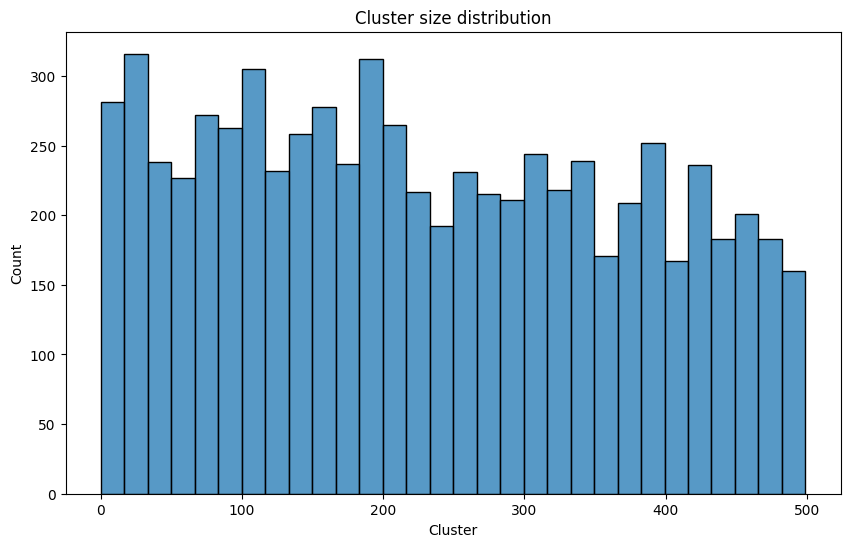

['golions2012', 'dolothrodo15', 'kony2012', 'grichuk4roty', 'thortheelf2015', 'elxn42', 'sona2015', 'la06', 'perry2016', 'ynwalfc2012', 'paidnfulleastsaidup2', 'delange9', 'kalb5', 'isaac4smash', 'motog3rdgen', '5ari8lel3ada', 'bo66y', 'ucretst1', 'carly2016', 'mywishin2013', 'auktop20', 'foobar2000', 'tru1017', 'hum120', 'roma2k15', 'bnppo12', 'jft96', 'grtmilano17', 'sangz1', 'psyqo200krc']
['djokovicvbautistaagut', 'misstheamex', 'amextennis']
['finalround', 'highstakes', 'challenge', 'round2', 'battleborn', 'battleground', 'fanduel', 'rivalryweek', 'thrillingclimax', 'brawl', 'therealhungergames', 'showdown', 'nightofchampions', 'itshowyoufinish', 'seavrsl', 'civilwar', 'rewatchingaofinal', 'sidebyside', 'kerryvdublin', 'battleofvikings', 'rivalry', 'thereareonly7rounds', 'crusadervictory', 'hibsvhearts', 'fanarmyfaceoff', 'tvk2finale', 'finalshowdown']
['pawsox', 'dolphins', 'ducks', 'dinosaurs', 'marlies', 'cats', 'seadogs', 'animal', 'wieners', 'weatherhounds', 'swans', 'rambler

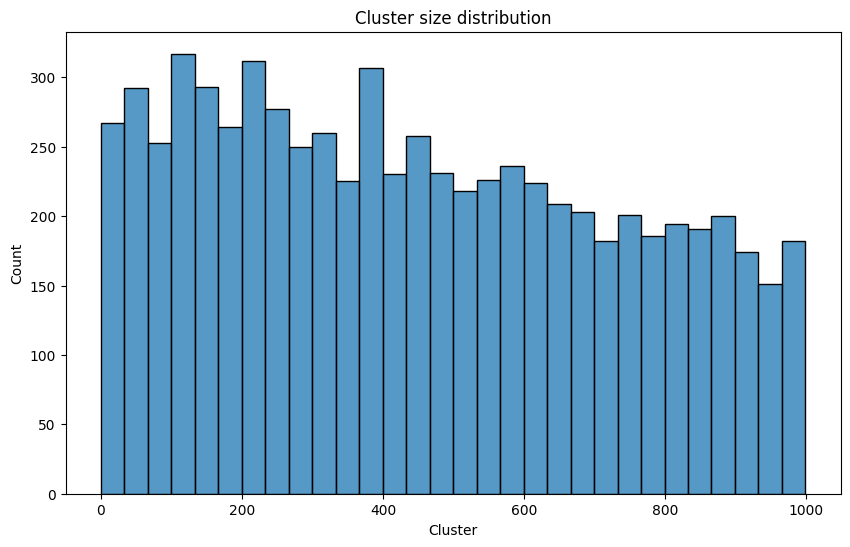

['clt', 'tbt', 'motwyw', 'mot', '3dt', 'qt', 'ckt', 'instagood', 'jt', 'freakysht', 'wut', 'kot', 'dst', 'tc', 'rekt']
['luc', 'lyon']
['horrorsquad', 'monstermafia', 'chrisfanatics', 'trancefamily', 'theunstabledean', 'lunaticfringe', 'freakshow']
['logansport', 'asheville', 'charlottetown', 'istillloveeastview', 'charlotte', 'greensboro', 'greenville', 'raleigh', 'belmont', 'beavercentral', 'westsalemyounglife']
['wwehampton']
['grassroots', 'bluegrass', 'weeds', 'trees', 'grass', 'clover', 'turf', 'yardofcocktail', 'charcoal', 'outside']
['onehellofanighttour', 'revivaltour', 'myworldtour', 'kidrockcruise', 'unbreakableworldtour', 'onevoicethetour', 'rebelhearttour', 'sweetsweetfantasytour', 'bigrevivaltour', 'rockorbustworldtour', 'jekyllnhydetour', 'prismaticworldtour']
['blackthornendmyrealhome', 'blackstar', 'blackbirdgang', 'darkpassenger', 'ratchet']
['downn', 'uprlka', 'closer', 'notupinhere']
['summerslam', 'summerside', 'wwesummerslam', 'copadelrey', 'nightofchampions', 'th

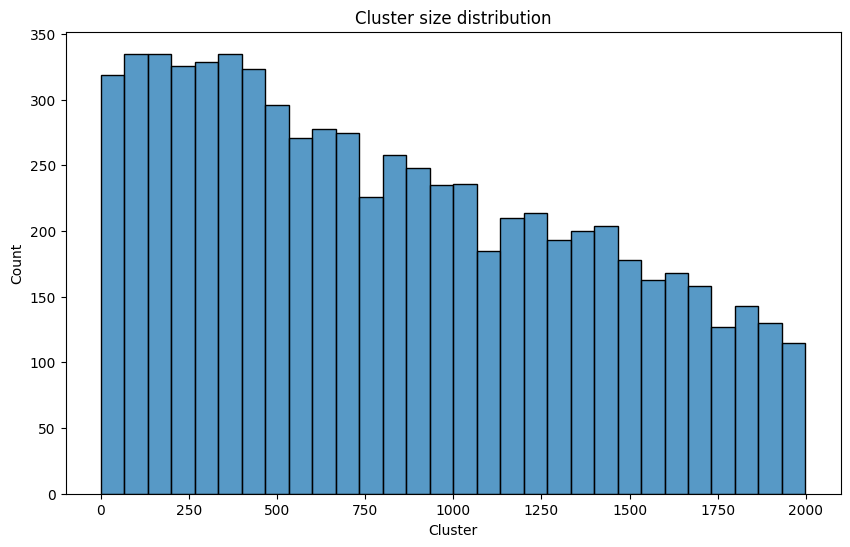

['dyk']
['martymcfly', 'mickymouse', 'magicmike', 'magicmikexxl']
['pirate', 'pirates', 'dirtypirate']
['denali', 'delmar', 'det']
['billboard']
['ncaa', 'umesvolleyball', 'ncaaf', 'smartncaa', 'unihoops', 'iaaf']
['hailtothevictors', 'allhailtheprince', 'weareallwinners']
['michiecorleone', 'racha', 'tarahcilla', 'alisareal']
['generous', 'purehonesty', 'wholesome', 'selfless']
['suplexcity']
['wave102footballphonein', 'phonearena']
['rqwn', 'rttt', 'tnpr', 'lrt', 'rhoc', 'tdot', 'str8likedat']
['wweraw', 'wwemondaynightraw', 'mondaynightraw', 'supershow']
['ben', 'jamesbb']
['livewireathletics', 'c3sports', 'planetsports', 'ibmsports']
['stayingalive', 'thriving', 'wellbeing', 'stayalive']
['west2020']
['hawks', 'letsgohawk', 'ducks', 'shockers', 'swans', 'thehawk4probowl', 'pens']
['merch', 'channingswag', 'swag', 'cityswag', 'jagswag', 'sameswag', 'ugadawgswag', 'swagcorner', 'swagswagswag']
['stud']
['internationaldirectionerday']
['mancrushmonday', 'sofarbacksunday', 'blackday', 

In [98]:
for k in [100, 500, 1000, 2000]:
    print(f'Number of clusters: {k}')
    _, optimized_cluster_labels, embeddings = clusterer.cluster_hashtags(
        hashtags['segmented_hashtags'].drop_duplicates().tolist(),
        model_params={'n_clusters': k}
    )

    scaler = StandardScaler()
    embeddings = scaler.fit_transform(embeddings)

    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(embeddings)

    tsne = TSNE(n_components=2)
    X_tsne = tsne.fit_transform(embeddings)

    umap = UMAP(n_components=2)
    X_umap = umap.fit_transform(embeddings)

    df = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2'])
    df['labels'] = optimized_cluster_labels

    fig = px.scatter(df, x='PCA1', y='PCA2', color='labels', title='PCA', width=800, height=600)
    fig.show()

    df = pd.DataFrame(X_tsne, columns=['t-SNE1', 't-SNE2'])
    df['labels'] = optimized_cluster_labels

    fig = px.scatter(df, x='t-SNE1', y='t-SNE2', color='labels', title='t-SNE', width=800, height=600)
    fig.show()

    df = pd.DataFrame(X_umap, columns=['UMAP1', 'UMAP2'])
    df['labels'] = optimized_cluster_labels

    fig = px.scatter(df, x='UMAP1', y='UMAP2', color='labels', title='UMAP', width=800, height=600)
    fig.show()

    plt.figure(figsize=(10, 6))
    sns.histplot(optimized_cluster_labels, bins=30)
    plt.title('Cluster size distribution')
    plt.xlabel('Cluster')
    plt.show()


    clustered_hashtags = pd.DataFrame({'Hashtag': hashtags.drop_duplicates(subset=['segmented_hashtags'])['hashtags'], 'Cluster': optimized_cluster_labels})
    grouped_df = clustered_hashtags.groupby('Cluster')['Hashtag'].apply(list).reset_index(name='Hashtags_in_Cluster')
    for _, row in grouped_df.iterrows():
        print(row['Hashtags_in_Cluster'][:30])

Number of clusters: 500


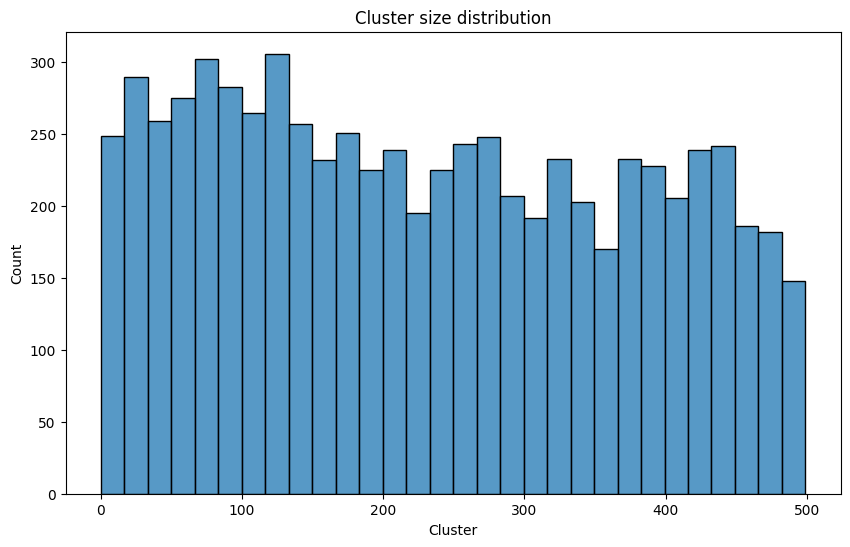

['golions2012', 'sona2015', 'ynwalfc2012', 'gqmoty2015', 'mywishin2013', '311day2012', 'psyqo200krc', 'imonit', 'yr10000', 'sukipt2012']
['bradley', 'noah', 'boris', 'armstrong', 'leo', 'he', 'ben', 'hehasfourbrot', 'luc', 'reggie', 'benghazi', 'yougoelton', 'lamar']
['dc', 'dunkinsave', 'dbf', 'dcu', 'dcfcfans', 'indvafg', 'dufc', 'dfc', 'teamgdcf', 'dyk', 'whitecapsfc', 'dbacks', 'sedc', 'dfs']
['ridgemountcup', 'crosstowncup', 'deutschebankchampionship', 'deustchebankchampionship', 'bringthecuphome', 'copadelrey', 'ballinacup2012', 'americascup', 'cuprun', 'capitalonecup', 'scottishcup', 'unescocup', 'nocup']
['ubersoccer', 'livewireathletics', 'c3sports', 'planetsports', 'nhl13', 'sc3stars', 'naijaurbansports', 'bentleyvolleyballl', 'ibmsports', 'nba2k13']
['transferwindow', 'thehaguedate', 'deadlineday', 'early', 'finalsweek', 'latepass', 'degeamisseddeadline', 'deadline']
['radiobiafra', 'irelandtalks4fm', 'webradio', 'internetradio', 'u2radio', 'hamradio', 'rockfileradio', 'mush

In [99]:
for k in [500]:
    print(f'Number of clusters: {k}')
    _, optimized_cluster_labels, embeddings = clusterer.cluster_hashtags(
        hashtags['segmented_hashtags'].drop_duplicates().tolist(),
        model_params={'n_clusters': k}
    )

    scaler = StandardScaler()
    embeddings = scaler.fit_transform(embeddings)

    tsne = TSNE(n_components=2)
    X_tsne = tsne.fit_transform(embeddings)

    umap = UMAP(n_components=2)
    X_umap = umap.fit_transform(embeddings)

    df = pd.DataFrame(X_tsne, columns=['Component 1', 'Component 2'])
    df['labels'] = optimized_cluster_labels

    fig = px.scatter(df, x='Component 1', y='Component 2', color='labels', title=f't-SNE of hashtag embeddings with {k} clusters', width=800, height=600)
    fig.show()

    df = pd.DataFrame(X_umap, columns=['Component 1', 'Component 2'])
    df['labels'] = optimized_cluster_labels

    fig = px.scatter(df, x='Component 1', y='Component 2', color='labels', title=f'UMAP of hashtag embeddings with {k} clusters', width=800, height=600)
    fig.show()

    plt.figure(figsize=(10, 6))
    sns.histplot(optimized_cluster_labels, bins=30)
    plt.title('Cluster size distribution')
    plt.xlabel('Cluster')
    plt.show()


    clustered_hashtags = pd.DataFrame({'Hashtag': hashtags.drop_duplicates(subset=['segmented_hashtags'])['hashtags'], 'Cluster': optimized_cluster_labels})
    grouped_df = clustered_hashtags.groupby('Cluster')['Hashtag'].apply(list).reset_index(name='Hashtags_in_Cluster')
    for _, row in grouped_df.iterrows():
        print(row['Hashtags_in_Cluster'][:30])

In [100]:
result_hashtags = clusterer.search_hashtags_within_cluster(
    hashtags['hashtags'].tolist(),
    'nba',
    clustering_model,
    cluster_labels,
    embeddings,
    threshold=0.25
)

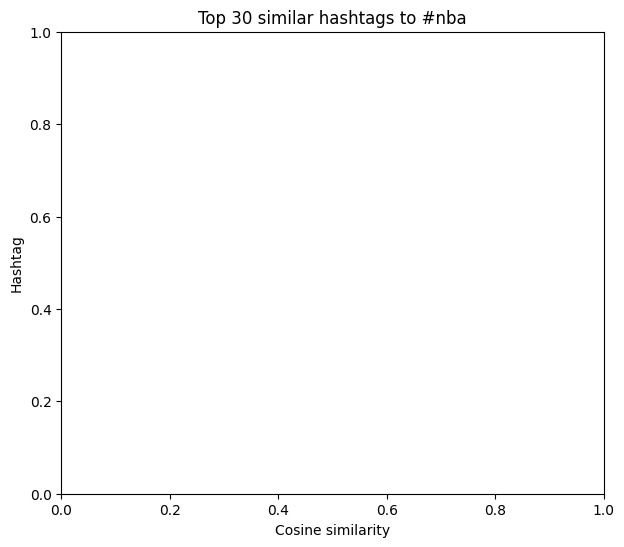

In [102]:
k = 30

plt.figure(figsize=(7, 6))
top_similar_hashtags = {hashtag: weight for hashtag, weight in result_hashtags}
top_similar_hashtags = dict(sorted(top_similar_hashtags.items(), key=lambda x: x[1], reverse=True)[:k])
sns.barplot(y=list(top_similar_hashtags.keys()), x=list(top_similar_hashtags.values()))
plt.title(f'Top {k} similar hashtags to #nba')
plt.xlabel('Cosine similarity')
plt.ylabel('Hashtag')
plt.show()